## QUESTION : Will the sentiment(positive /negative) of FED 's speeches has an effect on the return of equity , gold ,bond and USDcurrency ?

Method : 
1. request web htm from FED newsevent page
2.  parse the news content from Year 2006 to 2023 with BeautifulSoup
3.  organize the news events into dataframe
4.  perform EDA on the dataframe , convert the datatype for date to datetime,check for null cell / duplicate 
5.  run preprocessing (remove stopwords , punctuation ,tokenize and lemmatize the text content)
6.  then perform Sentiment Itensity Analyzer on the words to get polarity score
7.  run subjectivity test on the words
8.  get history data of all the intruments from yahoo finance and save into csv file to be read later
9.  merge market data with news sentiment df
10.  plot pairplot
11.  perform logistic regression model to train and test the dataset on different instrument
12.  evaluate the model result

In [1]:
 #import relevant packages

from bs4 import BeautifulSoup
import pandas as pd
import matplotlib.pyplot as plt
import requests
import seaborn as sns


get_ipython().run_line_magic("matplotlib","inline")
                             

In [2]:
#request the url  of main page and pass it to beautifulsoup to parser the html

url="https://www.federalreserve.gov/newsevents/speeches.htm"
get_html=requests.get(url)
soup=BeautifulSoup(get_html.content,"html.parser")

In [3]:
#inspect the parser html

soup

<!DOCTYPE html>

<html class="no-js" lang="en">
<head>
<meta charset="utf-8"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<meta content="width=device-width, initial-scale=1.0, minimum-scale=1.0 maximum-scale=1.6, user-scalable=1" name="viewport"/>
<meta content="Board of Governors of the Federal Reserve System, Federal Reserve Board of Governors, Federal Reserve Board, Federal Reserve" name="keywords">
<meta content="The Federal Reserve Board of Governors in Washington DC." name="description">
<meta content="article" property="og:type">
<meta content="Speeches" property="og:title"/>
<meta content="https://www.federalreserve.gov/images/social-media/social-default-image-opengraph.jpg" property="og:image"/>
<meta content="Board of Governors of the Federal Reserve System" property="og:image:alt"/>
<meta content="The Federal Reserve Board of Governors in Washington DC." property="og:description"/>
<meta content="https://www.federalreserve.gov/newsevents/speeches.htm" property="o

In [4]:
#to retrieve all the yearly links  href to each year 
news_link = []
for ul in soup.findAll("ul", attrs={"class": "list-unstyled panel-body__list"}):
    for li in ul.find_all("li"):
        a_tag = li.find("a")
        if a_tag:
            news_link.append(a_tag["href"])  

#only take the links from 2006 to 2023 
links_from_06_23=news_link[:-1]

#create the http link from the href list 
http_links=[]
for link in links_from_06_23:
    http=("https://www.federalreserve.gov"+ link)
    http_links.append(http)
    

http_links

['https://www.federalreserve.gov/newsevents/speech/2023-speeches.htm',
 'https://www.federalreserve.gov/newsevents/speech/2022-speeches.htm',
 'https://www.federalreserve.gov/newsevents/speech/2021-speeches.htm',
 'https://www.federalreserve.gov/newsevents/speech/2020-speeches.htm',
 'https://www.federalreserve.gov/newsevents/speech/2019-speeches.htm',
 'https://www.federalreserve.gov/newsevents/speech/2018-speeches.htm',
 'https://www.federalreserve.gov/newsevents/speech/2017-speeches.htm',
 'https://www.federalreserve.gov/newsevents/speech/2016-speeches.htm',
 'https://www.federalreserve.gov/newsevents/speech/2015-speeches.htm',
 'https://www.federalreserve.gov/newsevents/speech/2014-speeches.htm',
 'https://www.federalreserve.gov/newsevents/speech/2013-speeches.htm',
 'https://www.federalreserve.gov/newsevents/speech/2012-speeches.htm',
 'https://www.federalreserve.gov/newsevents/speech/2011-speeches.htm',
 'https://www.federalreserve.gov/newsevents/speech/2010speech.htm',
 'https:/

In [5]:
#to retrive the list of news from each year

html_list=[]
for year in http_links:
    response=requests.get(year)
    html_content=BeautifulSoup(response.content, "html.parser")
    html_list.append(html_content)

html_list[1]

<!DOCTYPE html>

<html class="no-js" lang="en">
<head>
<meta charset="utf-8"/>
<meta content="IE=edge" http-equiv="X-UA-Compatible"/>
<meta content="width=device-width, initial-scale=1.0, minimum-scale=1.0 maximum-scale=1.6, user-scalable=1" name="viewport"/>
<meta content="The Federal Reserve Board of Governors in Washington DC." name="description">
<meta content="article" property="og:type">
<meta content="2022 Speeches" property="og:title">
<meta content="https://www.federalreserve.gov/images/social-media/social-default-image-opengraph.jpg" property="og:image"/>
<meta content="Board of Governors of the Federal Reserve System" property="og:image:alt"/>
<meta content="The Federal Reserve Board of Governors in Washington DC." property="og:description"/>
<meta content="https://www.federalreserve.gov/newsevents/speech/2022-speeches.htm" property="og:url"/>
<meta content="summary" name="twitter:card"/>
<meta content="2022 Speeches" name="twitter:title"/>
<meta content="https://www.federal

In [6]:
len(html_list)

18

In [7]:
full_speech_link=[]

for events in html_list:
    event=events.find_all("div",{"class":"col-xs-9 col-md-10 eventlist__event"})
    for tags in event:
        a_tags= tags.find_all("a")
        for a_tag in a_tags:
           if "href" in a_tag.attrs:
               full_speech_link.append(a_tag["href"])
full_speech_link

['/newsevents/speech/bowman20231205a.htm',
 'https://www.aspeninstitute.org/events/towards-a-more-inclusive-financial-system/',
 '/newsevents/speech/powell20231201a.htm',
 'https://live.spelman.edu/',
 '/newsevents/speech/barr20231201a.htm',
 'https://www.bankingsupervision.europa.eu/press/conferences/html/ECB_Forum_Banking_supervision.en.html',
 '/newsevents/speech/barr20231128a.htm',
 'https://youtube.com/live/aKTaSa3N2mw ',
 '/newsevents/speech/bowman20231128a.htm',
 '/newsevents/speech/waller20231128a.htm',
 'https://www.aei.org/events/the-federal-reserve-and-the-economic-outlook-a-conversation-with-federal-reserve-governor-christopher-j-waller/',
 '/newsevents/speech/cook20231116a.htm',
 'https://vimeo.com/event/3857893/ff5dc6210a',
 '/newsevents/speech/barr20231116a.htm',
 'https://www.newyorkfed.org/newsevents/events/markets/2023/1116-2023',
 '/newsevents/speech/jefferson20231114a.htm',
 'https://www.snb.ch/en/services-events/digital-services/research-tv',
 '/newsevents/speech/c

In [8]:
#only retrieve the news event speech link from the full_speech_link

import re
event_speeches_href=[]
news_link_pattern=re.compile("^/newsevents/speech/[a-z0-9]*.htm$")
for event_speech in full_speech_link:
    if news_link_pattern.search(event_speech):
        if True:
            event_speeches_href.append(event_speech)
     
len(event_speeches_href)

1066

In [9]:

# Dictionary to store the count of each element
element_count = {}

# Iterate through the list and count occurrences of each element
for item in event_speeches_href:
    if item in element_count:
        element_count[item] += 1
    else:
        element_count[item] = 1

# Print duplicates
print("Duplicates in the list:")
for item, count in element_count.items():
    if count > 1:
        print(item)



Duplicates in the list:
/newsevents/speech/cook20231113a.htm
/newsevents/speech/powell20230928a.htm
/newsevents/speech/bowman20221020a.htm
/newsevents/speech/brainard20220829a.htm
/newsevents/speech/powell20220524a.htm
/newsevents/speech/quarles20210526a.htm
/newsevents/speech/quarles20191114a.htm
/newsevents/speech/bowman20191021a.htm
/newsevents/speech/powell20190709a.htm
/newsevents/speech/yellen20170119a.htm
/newsevents/speech/yellen20170118a.htm
/newsevents/speech/brainard20170117a.htm
/newsevents/speech/yellen20170112a.htm
/newsevents/speech/bernanke20090821a.htm
/newsevents/speech/bernanke20080513.htm


In [10]:
# to remove second occurance og duplicate items in the list event_speeches_href

unique_speeches_href=[]
for item in event_speeches_href:
    if element_count[item] > 1:
        element_count[item] -= 1
    else:
        unique_speeches_href.append(item)
        
len(unique_speeches_href)

1051

In [11]:
link_to_full_articles = []
for href in unique_speeches_href:
    link_href=("https://www.federalreserve.gov"+ href)
    link_to_full_articles.append(link_href)
    

link_to_full_articles



['https://www.federalreserve.gov/newsevents/speech/bowman20231205a.htm',
 'https://www.federalreserve.gov/newsevents/speech/powell20231201a.htm',
 'https://www.federalreserve.gov/newsevents/speech/barr20231201a.htm',
 'https://www.federalreserve.gov/newsevents/speech/barr20231128a.htm',
 'https://www.federalreserve.gov/newsevents/speech/bowman20231128a.htm',
 'https://www.federalreserve.gov/newsevents/speech/waller20231128a.htm',
 'https://www.federalreserve.gov/newsevents/speech/cook20231116a.htm',
 'https://www.federalreserve.gov/newsevents/speech/barr20231116a.htm',
 'https://www.federalreserve.gov/newsevents/speech/jefferson20231114a.htm',
 'https://www.federalreserve.gov/newsevents/speech/cook20231113a.htm',
 'https://www.federalreserve.gov/newsevents/speech/powell20231109a.htm',
 'https://www.federalreserve.gov/newsevents/speech/bowman20231109a.htm',
 'https://www.federalreserve.gov/newsevents/speech/jefferson20231108a.htm',
 'https://www.federalreserve.gov/newsevents/speech/powe

In [49]:
from concurrent.futures import ThreadPoolExecutor,as_completed
import concurrent
import requests
from bs4 import BeautifulSoup

page_source = []

def fetch_page(url):
    response = requests.get(url)
    if response.status_code == 200:
        return response.content
    else:
        return None

# Limit the number of concurrent requests to avoid overwhelming the server
max_workers = 5

with ThreadPoolExecutor(max_workers=max_workers) as executor:
    # Submit requests concurrently
    future_to_url = {executor.submit(fetch_page, url): url for url in link_to_full_articles}
    for future in as_completed(future_to_url):
        url = future_to_url[future]
        try:
            page_content = future.result()
            if page_content:
                source = BeautifulSoup(page_content, "html.parser")
                page_source.append(source)
        except Exception as e:
            print(f"Failed to fetch {url}: {e}")



In [13]:
#to get all the news in each year amd compose all these into list 

dates=[]
speakers=[]
speech_titles=[]
text_content=[]


for i in range(len(page_source)):
    article_elements=page_source[i].find_all("div", {"id":"article"})
    for element in article_elements:
        date_element = element.find_all("p",{"class":"article__time"})
        for date in date_element:
            date_text=date.get_text(strip=True)  
            dates.append(date_text)
        speaker_element=element.find_all("p",{"class":"speaker"})
        for speaker in speaker_element:
            speaker_text=speaker.get_text(strip=True)  
            speakers.append(speaker_text)
        title_element = element.find_all("h3",{"class":"title"})
        for title in title_element:
            title_text=title.get_text(strip = True)
            speech_titles.append(title_text)
        text_element = element.find_all("div",{"class":"col-xs-12 col-sm-8 col-md-8"})
        for text in text_element:
            texts=text.get_text(strip = True)
            text_content.append(texts.lower())
 
  
 
           
    

         
      
       



       
 
        

## transfer the lists of data into Dataframe with Pandas 

In [14]:

print(len(speakers))
print(len(speech_titles))
print(len(dates))
print(len(text_content))

1049
1049
1049
1049


In [15]:
data={"Date":dates ,"Speech Titles":speech_titles, "Speakers":speakers,"Text Content":text_content}
df=pd.DataFrame(data)
df

,Date,Speech Titles,Speakers,Text Content
0,"December 01, 2023",Opening Remarks,Chair Jerome H. Powell,"thank you, president gayle, and thank you for ..."
1,"November 28, 2023",Reflections on the Economy and Monetary Policy,Governor Michelle W. Bowman,it is a pleasure to join you this morning in s...
2,"December 01, 2023",The Importance of Effective Liquidity Risk Man...,Vice Chair for Supervision Michael S. Barr,thank you for the opportunity to speak today.1...
3,"December 05, 2023",Building a More Inclusive Financial System thr...,Governor Michelle W. Bowman,accessible keys for video[space bar]toggles pl...
4,"November 14, 2023",Elevated Economic Uncertainty: Causes and Cons...,Vice Chair Philip N. Jefferson,***introductionthank you for the opportunity t...
...,...,...,...,...
1044,"January 18, 2006",Productivity and Economic Outlook,Governor Susan Schmidt Bies,i appreciate the opportunity to speak with you...
1045,"April 10, 2006",Enterprise-Wide Compliance-Risk Management,Governor Mark W. Olson,thank you for giving me the opportunity to spe...
1046,"February 23, 2006","Globalization, Insurers, and Regulators: Share...","Vice Chairman Roger W. Ferguson, Jr.",i am honored to deliver the keynote address at...
1047,"February 24, 2006",The Benefits of Price Stability,Chairman Ben S. Bernanke,it is a great pleasure for me to return to pri...


## Perform Explanatory Data Analysis (EDA) with the df

In [16]:
# to count the number of words in each speech text

df['Text_len'] = df['Text Content'].str.split().apply(len)
df

,Date,Speech Titles,Speakers,Text Content,Text_len
0,"December 01, 2023",Opening Remarks,Chair Jerome H. Powell,"thank you, president gayle, and thank you for ...",1602
1,"November 28, 2023",Reflections on the Economy and Monetary Policy,Governor Michelle W. Bowman,it is a pleasure to join you this morning in s...,3805
2,"December 01, 2023",The Importance of Effective Liquidity Risk Man...,Vice Chair for Supervision Michael S. Barr,thank you for the opportunity to speak today.1...,3704
3,"December 05, 2023",Building a More Inclusive Financial System thr...,Governor Michelle W. Bowman,accessible keys for video[space bar]toggles pl...,2050
4,"November 14, 2023",Elevated Economic Uncertainty: Causes and Cons...,Vice Chair Philip N. Jefferson,***introductionthank you for the opportunity t...,3314
...,...,...,...,...,...
1044,"January 18, 2006",Productivity and Economic Outlook,Governor Susan Schmidt Bies,i appreciate the opportunity to speak with you...,2448
1045,"April 10, 2006",Enterprise-Wide Compliance-Risk Management,Governor Mark W. Olson,thank you for giving me the opportunity to spe...,1689
1046,"February 23, 2006","Globalization, Insurers, and Regulators: Share...","Vice Chairman Roger W. Ferguson, Jr.",i am honored to deliver the keynote address at...,2596
1047,"February 24, 2006",The Benefits of Price Stability,Chairman Ben S. Bernanke,it is a great pleasure for me to return to pri...,4290


In [17]:
#divde the speaker name into last name column ,and add a new colums
df['Speakers']   = df['Speakers'].str.replace(", Jr.", "")
df['Last_name'] = df['Speakers'].str.split(" ", expand = False).str.get(-1)


In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1049 entries, 0 to 1048
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Date           1049 non-null   object
 1   Speech Titles  1049 non-null   object
 2   Speakers       1049 non-null   object
 3   Text Content   1049 non-null   object
 4   Text_len       1049 non-null   int64 
 5   Last_name      1049 non-null   object
dtypes: int64(1), object(5)
memory usage: 49.3+ KB


In [19]:
#convert the Date colummns type to datetime
df["Date"]=pd.to_datetime(df["Date"])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1049 entries, 0 to 1048
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           1049 non-null   datetime64[ns]
 1   Speech Titles  1049 non-null   object        
 2   Speakers       1049 non-null   object        
 3   Text Content   1049 non-null   object        
 4   Text_len       1049 non-null   int64         
 5   Last_name      1049 non-null   object        
dtypes: datetime64[ns](1), int64(1), object(4)
memory usage: 49.3+ KB


In [20]:
group_last_name=df.groupby(["Last_name","Date"]).apply(lambda x :x.sort_values(by = "Last_name", ascending = False))
group_last_name

Date  \
Last_name Date                        
Affairs   2009-08-21 810 2009-08-21   
Barr      2022-09-07 119 2022-09-07   
          2022-10-12 106 2022-10-12   
          2022-12-01 112 2022-12-01   
          2023-02-07 84  2023-02-07   
...                             ...   
Yellen    2017-09-26 398 2017-09-26   
          2017-10-04 391 2017-10-04   
          2017-10-15 388 2017-10-15   
          2017-10-20 409 2017-10-20   
          2017-11-07 384 2017-11-07   

                                                              Speech Titles  \
Last_name Date                                                                
Affairs   2009-08-21 810  Bagehot's Dictum in Practice: Formulating and ...   
Barr      2022-09-07 119       Making the Financial System Safer and Fairer   
          2022-10-12 106  Managing the Promise and Risk of Financial Inn...   
          2022-12-01 112                           Why Bank Capital Matters   
          2023-02-07 84   Remarks at the “Banking on Financial Inclusion...   
...                                                                     ...   
Yellen    2017-09-26 398        Inflation, Uncertainty, and Monetary Policy   
          2017-10-04 391                                  Welcoming Remarks   
          2017-10-15 388               The U.S. Economy and Monetary Policy   
          2017-10-20 409  A Challenging Decade and a Question for the Fu...   
          2017-11-07 384  Remarks accepting the 2017 Paul H. Douglas Awa...   

                                                                   Speakers  \
Last_name Date                                                                
Affairs   2009-08-21 810  Brian F. Madigan, Director, Division of Moneta...   
Barr      2022-09-07 119         Vice Chair for Supervision Michael S. Barr   
          2022-10-12 106         Vice Chair for Supervision Michael S. Barr   
          2022-12-01 112         Vice Chair for Supervision Michael S. Barr   
          2023-02-07 84          Vice Chair for Supervision Michael S. Barr   
...                                                                     ...   
Yellen    2017-09-26 398                              Chair Janet L. Yellen   
          2017-10-04 391                              Chair Janet L. Yellen   
          2017-10-15 388                              Chair Janet L. Yellen   
          2017-10-20 409                              Chair Janet L. Yellen   
          2017-11-07 384                              Chair Janet L. Yellen   

                                                               Text Content  \
Last_name Date                                                                
Affairs   2009-08-21 810  as a result of the developments of the past tw...   
Barr      2022-09-07 119  thank you, david, and thank you to the brookin...   
          2022-10-12 106  thank you, chris, and thank you for the invita...   
          2022-12-01 112  in my first speech as vice chair for supervisi...   
          2023-02-07 84   thank you, bill, and thank you to hope enterpr...   
...                                                                     ...   
Yellen    2017-09-26 398  i would like to thank the national association...   
          2017-10-04 391  i am very glad to welcome everyone here to thi...   
          2017-10-15 388  i would like to thank the group of thirty for ...   
          2017-10-20 409  i am delighted to address the national economi...   
          2017-11-07 384  thank you for the honor of sharing this award ...   

                          Text_len Last_name  
Last_name Date                                
Affairs   2009-08-21 810      7018   Affairs  
Barr      2022-09-07 119      3025      Barr  
          2022-10-12 106      2184      Barr  
          2022-12-01 112      5214      Barr  
          2023-02-07 84       4436      Barr  
...                            ...       ...  
Yellen    2017-09-26 398      8284    Yellen  
          2017-1

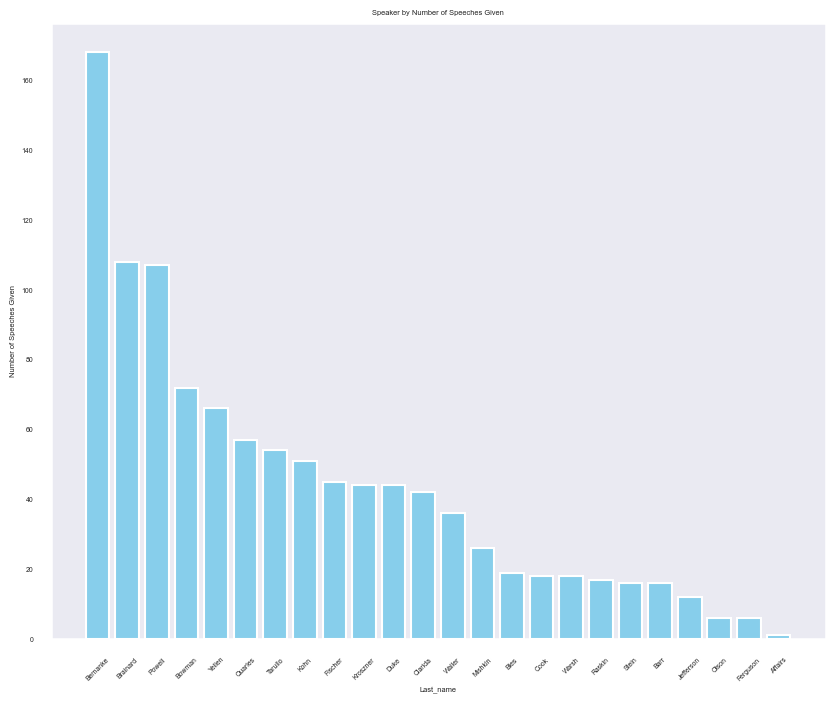

In [21]:
#to summarize the speaker's number of speeches given by order
count_lastname = df["Last_name"].value_counts()
count_lastname


# Plotting the histogram
plt.figure(figsize=(10,8))
sns.set_context("talk", font_scale=0.3)
sns.set_style("dark")

plt.bar(count_lastname.index,count_lastname.values,color="skyblue")
plt.xlabel('Last_name')
plt.ylabel('Number of Speeches Given')
plt.title('Speaker by Number of Speeches Given')
plt.xticks(rotation=45)
plt.show()

In [22]:
#split the datetime columns into year, month and day

df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day

df


,Date,Speech Titles,Speakers,Text Content,Text_len,Last_name,Year,Month,Day
0,2023-12-01,Opening Remarks,Chair Jerome H. Powell,"thank you, president gayle, and thank you for ...",1602,Powell,2023,12,1
1,2023-11-28,Reflections on the Economy and Monetary Policy,Governor Michelle W. Bowman,it is a pleasure to join you this morning in s...,3805,Bowman,2023,11,28
2,2023-12-01,The Importance of Effective Liquidity Risk Man...,Vice Chair for Supervision Michael S. Barr,thank you for the opportunity to speak today.1...,3704,Barr,2023,12,1
3,2023-12-05,Building a More Inclusive Financial System thr...,Governor Michelle W. Bowman,accessible keys for video[space bar]toggles pl...,2050,Bowman,2023,12,5
4,2023-11-14,Elevated Economic Uncertainty: Causes and Cons...,Vice Chair Philip N. Jefferson,***introductionthank you for the opportunity t...,3314,Jefferson,2023,11,14
...,...,...,...,...,...,...,...,...,...
1044,2006-01-18,Productivity and Economic Outlook,Governor Susan Schmidt Bies,i appreciate the opportunity to speak with you...,2448,Bies,2006,1,18
1045,2006-04-10,Enterprise-Wide Compliance-Risk Management,Governor Mark W. Olson,thank you for giving me the opportunity to spe...,1689,Olson,2006,4,10
1046,2006-02-23,"Globalization, Insurers, and Regulators: Share...",Vice Chairman Roger W. Ferguson,i am honored to deliver the keynote address at...,2596,Ferguson,2006,2,23
1047,2006-02-24,The Benefits of Price Stability,Chairman Ben S. Bernanke,it is a great pleasure for me to return to pri...,4290,Bernanke,2006,2,24


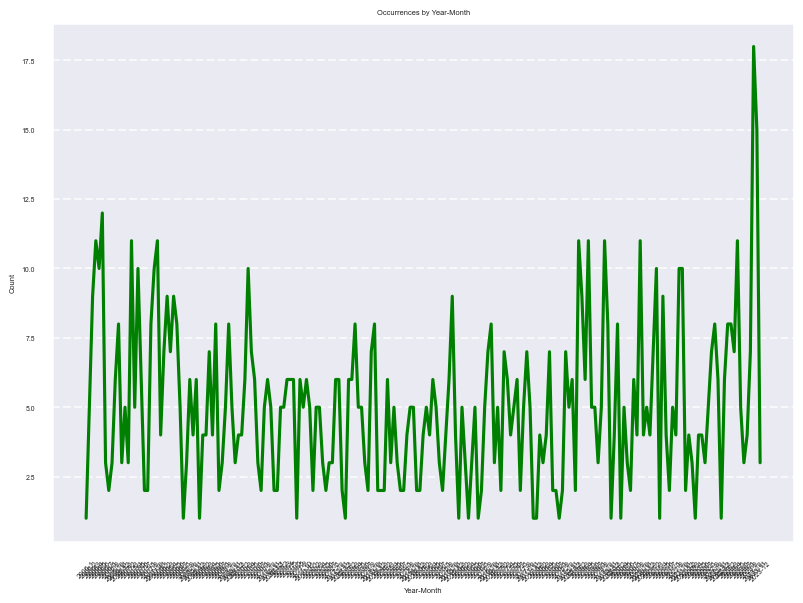

In [23]:
#to look into the number of speeches by FED along the year 

group_year_month = df.groupby(["Year", "Month"]).size().reset_index(name='Count')

group_year_month['Year-Month'] = group_year_month['Year'].astype(str) + '-' + group_year_month['Month'].astype(str)
plt.figure(figsize=(8,6))
group_year_month['Count'].plot(kind='line', color='green')
plt.xlabel('Year-Month')
plt.ylabel('Count')
plt.title('Occurrences by Year-Month')
plt.xticks(range(len(group_year_month)), group_year_month['Year-Month'], rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


## Perform NLTK sentiment analysis on the speech 

In [24]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import nltk
from tqdm import tqdm
from stopwordz import clean_text
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')
nltk.download('vader_lexicon')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [25]:
# Preprecessing text content to be ready for sentiment analysis 
lemmatizer = WordNetLemmatizer()
def preprocess_text(text_content):
    stop_words = set(stopwords.words("english")) #get english stopwords
    word_tokens = word_tokenize(text_content)
    filtered_text = [word for word in word_tokens if word not in stop_words]  # Remove stopwords
    lemmatized_words = [lemmatizer.lemmatize(word) for word in filtered_text]  # Perform lemmatization
    return ' '.join(lemmatized_words)

df['preprocessed_text'] = df['Text Content'].apply(preprocess_text)


In [26]:
df["cleaned text"] = df['preprocessed_text'].apply(clean_text)
df

,Date,Speech Titles,Speakers,Text Content,Text_len,Last_name,Year,Month,Day,preprocessed_text,cleaned text
0,2023-12-01,Opening Remarks,Chair Jerome H. Powell,"thank you, president gayle, and thank you for ...",1602,Powell,2023,12,1,"thank , president gayle , thank invitation vis...",president gayle invitation visit today fortuna...
1,2023-11-28,Reflections on the Economy and Monetary Policy,Governor Michelle W. Bowman,it is a pleasure to join you this morning in s...,3805,Bowman,2023,11,28,pleasure join morning salt lake city utah bank...,pleasure join morning salt lake city utah bank...
2,2023-12-01,The Importance of Effective Liquidity Risk Man...,Vice Chair for Supervision Michael S. Barr,thank you for the opportunity to speak today.1...,3704,Barr,2023,12,1,thank opportunity speak today.1i 'm delighted ...,opportunity speak today1i delighted celebrate ...
3,2023-12-05,Building a More Inclusive Financial System thr...,Governor Michelle W. Bowman,accessible keys for video[space bar]toggles pl...,2050,Bowman,2023,12,5,accessible key video [ space bar ] toggle play...,accessible key video space bar toggle playpaus...
4,2023-11-14,Elevated Economic Uncertainty: Causes and Cons...,Vice Chair Philip N. Jefferson,***introductionthank you for the opportunity t...,3314,Jefferson,2023,11,14,* * * introductionthank opportunity speak toda...,introductionthank opportunity speak today attu...
...,...,...,...,...,...,...,...,...,...,...,...
1044,2006-01-18,Productivity and Economic Outlook,Governor Susan Schmidt Bies,i appreciate the opportunity to speak with you...,2448,Bies,2006,1,18,appreciate opportunity speak today productivit...,opportunity speak today productivity outlook e...
1045,2006-04-10,Enterprise-Wide Compliance-Risk Management,Governor Mark W. Olson,thank you for giving me the opportunity to spe...,1689,Olson,2006,4,10,thank giving opportunity speak one broad issue...,opportunity speak broad issue discussing day n...
1046,2006-02-23,"Globalization, Insurers, and Regulators: Share...",Vice Chairman Roger W. Ferguson,i am honored to deliver the keynote address at...,2596,Ferguson,2006,2,23,honored deliver keynote address important inte...,honored deliver keynote address international ...
1047,2006-02-24,The Benefits of Price Stability,Chairman Ben S. Bernanke,it is a great pleasure for me to return to pri...,4290,Bernanke,2006,2,24,"great pleasure return princeton today , see ma...",great pleasure return princeton today friend c...


In [27]:
#run sentiment intensity analyzer on the speech text content and getting the compound value 

sia = SentimentIntensityAnalyzer()
compound=[]
neg=[]
pos=[]
neu=[]

    
for i in tqdm(range(len(df["cleaned text"])), desc="Processing sentiment analysis"):
    text = df["cleaned text"][i]
    SIA = sia.polarity_scores(text)
    compound.append(SIA["compound"])
    neg.append(SIA["neg"])
    pos.append(SIA["pos"])
    neu.append(SIA["neu"])         
  
    

Processing sentiment analysis: 100%|██████████| 1049/1049 [00:17<00:00, 59.13it/s]


In [28]:
df["compound"]=compound 
df["negative"]=neg
df["positive"]=pos
df["neutral"]=neu


In [29]:
df

,Date,Speech Titles,Speakers,Text Content,Text_len,Last_name,Year,Month,Day,preprocessed_text,cleaned text,compound,negative,positive,neutral
0,2023-12-01,Opening Remarks,Chair Jerome H. Powell,"thank you, president gayle, and thank you for ...",1602,Powell,2023,12,1,"thank , president gayle , thank invitation vis...",president gayle invitation visit today fortuna...,0.9991,0.059,0.209,0.732
1,2023-11-28,Reflections on the Economy and Monetary Policy,Governor Michelle W. Bowman,it is a pleasure to join you this morning in s...,3805,Bowman,2023,11,28,pleasure join morning salt lake city utah bank...,pleasure join morning salt lake city utah bank...,0.9992,0.099,0.158,0.744
2,2023-12-01,The Importance of Effective Liquidity Risk Man...,Vice Chair for Supervision Michael S. Barr,thank you for the opportunity to speak today.1...,3704,Barr,2023,12,1,thank opportunity speak today.1i 'm delighted ...,opportunity speak today1i delighted celebrate ...,0.9682,0.126,0.138,0.737
3,2023-12-05,Building a More Inclusive Financial System thr...,Governor Michelle W. Bowman,accessible keys for video[space bar]toggles pl...,2050,Bowman,2023,12,5,accessible key video [ space bar ] toggle play...,accessible key video space bar toggle playpaus...,0.9995,0.031,0.186,0.783
4,2023-11-14,Elevated Economic Uncertainty: Causes and Cons...,Vice Chair Philip N. Jefferson,***introductionthank you for the opportunity t...,3314,Jefferson,2023,11,14,* * * introductionthank opportunity speak toda...,introductionthank opportunity speak today attu...,-0.9998,0.212,0.075,0.713
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1044,2006-01-18,Productivity and Economic Outlook,Governor Susan Schmidt Bies,i appreciate the opportunity to speak with you...,2448,Bies,2006,1,18,appreciate opportunity speak today productivit...,opportunity speak today productivity outlook e...,0.9995,0.063,0.200,0.736
1045,2006-04-10,Enterprise-Wide Compliance-Risk Management,Governor Mark W. Olson,thank you for giving me the opportunity to spe...,1689,Olson,2006,4,10,thank giving opportunity speak one broad issue...,opportunity speak broad issue discussing day n...,0.9954,0.114,0.170,0.716
1046,2006-02-23,"Globalization, Insurers, and Regulators: Share...",Vice Chairman Roger W. Ferguson,i am honored to deliver the keynote address at...,2596,Ferguson,2006,2,23,honored deliver keynote address important inte...,honored deliver keynote address international ...,0.9994,0.100,0.221,0.679
1047,2006-02-24,The Benefits of Price Stability,Chairman Ben S. Bernanke,it is a great pleasure for me to return to pri...,4290,Bernanke,2006,2,24,"great pleasure return princeton today , see ma...",great pleasure return princeton today friend c...,0.9998,0.087,0.199,0.715


In [30]:
pip install textblob


Note: you may need to restart the kernel to use updated packages.


In [31]:
from textblob import TextBlob
tqdm.pandas()
df["subjectivity"] = df["cleaned text"].progress_apply(lambda text : TextBlob(text).sentiment.subjectivity)
    

100%|██████████| 1049/1049 [00:05<00:00, 197.65it/s]


In [32]:
df

,Date,Speech Titles,Speakers,Text Content,Text_len,Last_name,Year,Month,Day,preprocessed_text,cleaned text,compound,negative,positive,neutral,subjectivity
0,2023-12-01,Opening Remarks,Chair Jerome H. Powell,"thank you, president gayle, and thank you for ...",1602,Powell,2023,12,1,"thank , president gayle , thank invitation vis...",president gayle invitation visit today fortuna...,0.9991,0.059,0.209,0.732,0.407656
1,2023-11-28,Reflections on the Economy and Monetary Policy,Governor Michelle W. Bowman,it is a pleasure to join you this morning in s...,3805,Bowman,2023,11,28,pleasure join morning salt lake city utah bank...,pleasure join morning salt lake city utah bank...,0.9992,0.099,0.158,0.744,0.382296
2,2023-12-01,The Importance of Effective Liquidity Risk Man...,Vice Chair for Supervision Michael S. Barr,thank you for the opportunity to speak today.1...,3704,Barr,2023,12,1,thank opportunity speak today.1i 'm delighted ...,opportunity speak today1i delighted celebrate ...,0.9682,0.126,0.138,0.737,0.427946
3,2023-12-05,Building a More Inclusive Financial System thr...,Governor Michelle W. Bowman,accessible keys for video[space bar]toggles pl...,2050,Bowman,2023,12,5,accessible key video [ space bar ] toggle play...,accessible key video space bar toggle playpaus...,0.9995,0.031,0.186,0.783,0.221806
4,2023-11-14,Elevated Economic Uncertainty: Causes and Cons...,Vice Chair Philip N. Jefferson,***introductionthank you for the opportunity t...,3314,Jefferson,2023,11,14,* * * introductionthank opportunity speak toda...,introductionthank opportunity speak today attu...,-0.9998,0.212,0.075,0.713,0.314586
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1044,2006-01-18,Productivity and Economic Outlook,Governor Susan Schmidt Bies,i appreciate the opportunity to speak with you...,2448,Bies,2006,1,18,appreciate opportunity speak today productivit...,opportunity speak today productivity outlook e...,0.9995,0.063,0.200,0.736,0.452726
1045,2006-04-10,Enterprise-Wide Compliance-Risk Management,Governor Mark W. Olson,thank you for giving me the opportunity to spe...,1689,Olson,2006,4,10,thank giving opportunity speak one broad issue...,opportunity speak broad issue discussing day n...,0.9954,0.114,0.170,0.716,0.433530
1046,2006-02-23,"Globalization, Insurers, and Regulators: Share...",Vice Chairman Roger W. Ferguson,i am honored to deliver the keynote address at...,2596,Ferguson,2006,2,23,honored deliver keynote address important inte...,honored deliver keynote address international ...,0.9994,0.100,0.221,0.679,0.313710
1047,2006-02-24,The Benefits of Price Stability,Chairman Ben S. Bernanke,it is a great pleasure for me to return to pri...,4290,Bernanke,2006,2,24,"great pleasure return princeton today , see ma...",great pleasure return princeton today friend c...,0.9998,0.087,0.199,0.715,0.385776


### Read csv files containing historical financial data and merge news data with Market data

In [64]:
df_snp500=pd.read_csv("SNP500_data.csv")
df_gold=pd.read_csv("GOLD_data.csv")   
df_fvg=pd.read_csv("^FVX_data.csv")
df_nasdaq=pd.read_csv("nasdaq_data.csv")
df_eurusd=pd.read_csv("eurusd_data.csv")
df_snp500.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4529 entries, 0 to 4528
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       4529 non-null   object 
 1   Open       4529 non-null   float64
 2   High       4529 non-null   float64
 3   Low        4529 non-null   float64
 4   Close      4529 non-null   float64
 5   Adj Close  4529 non-null   float64
 6   Volume     4529 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 247.8+ KB


In [62]:
#to check if there is infinite value that will affect the analysis later
inf_mask = df_snp500.isin([np.inf, -np.inf])
col_inf=inf_mask.any(axis=0)
col_inf

Date            False
Open            False
High            False
Low             False
Close           False
Adj Close       False
Volume          False
daily return    False
Log Return      False
dtype: bool

In [65]:
#convert the Date column type to datetime 

df_snp500["Date"]=pd.to_datetime(df_snp500["Date"])
df_gold["Date"]=pd.to_datetime(df_gold["Date"])
df_fvg["Date"]=pd.to_datetime(df_fvg["Date"])
df_nasdaq["Date"]=pd.to_datetime(df_nasdaq["Date"])
df_eurusd["Date"]=pd.to_datetime(df_eurusd["Date"])

C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


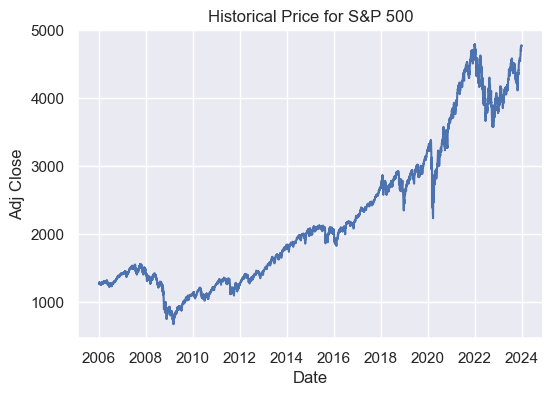

C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


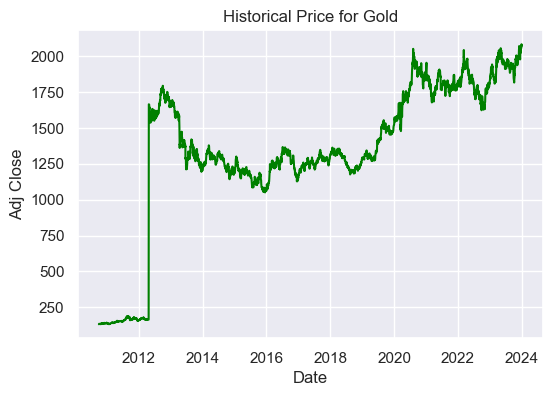

C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


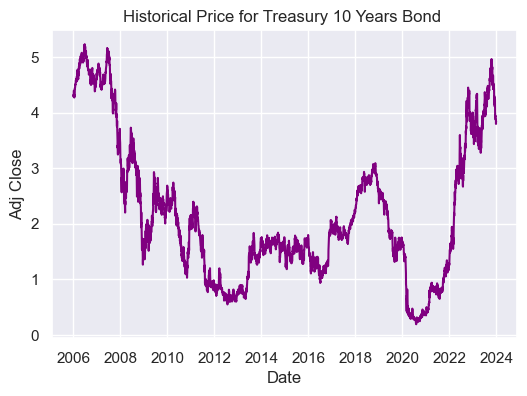

C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


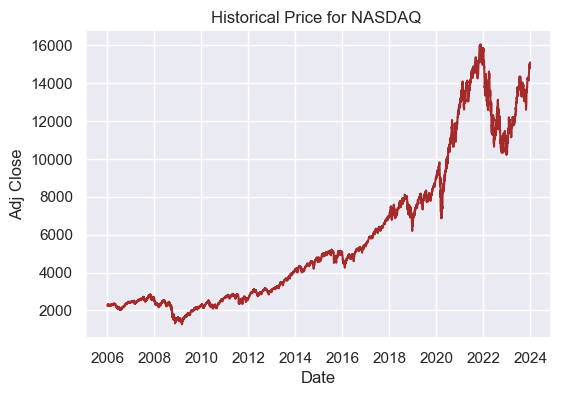

C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


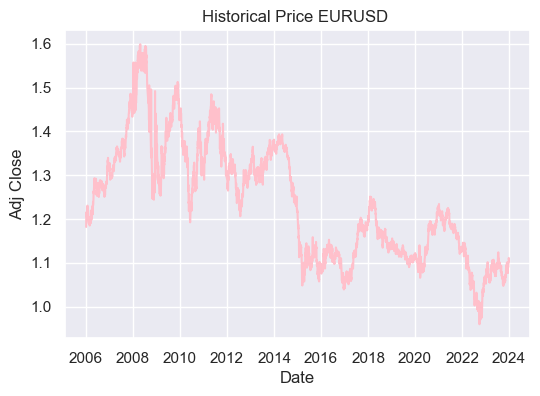

In [71]:
# plt the price historical price action of all three index

sns.set(font_scale=1)
#s&p500
plt.figure(figsize=(6,4))
sns.lineplot(data=df_snp500, x ="Date" , y="Adj Close")
plt.xlabel("Date")
plt.ylabel("Adj Close")
plt.title("Historical Price for S&P 500" )
plt.show()

#goldindex
plt.figure(figsize=(6,4))
sns.lineplot(data=df_gold, x ="Date" , y="Adj Close",color="green")
plt.xlabel("Date")
plt.ylabel("Adj Close")
plt.title("Historical Price for Gold" )
plt.show()

#tresury bond 10 year rate
plt.figure(figsize=(6,4))
sns.lineplot(data=df_fvg, x ="Date" , y="Adj Close", color="purple")
plt.xlabel("Date")
plt.ylabel("Adj Close")
plt.title("Historical Price for Treasury 10 Years Bond " )
plt.show()

#NASDAQ 
plt.figure(figsize=(6,4))
sns.lineplot(data=df_nasdaq, x ="Date" , y="Adj Close", color="brown")
plt.xlabel("Date")
plt.ylabel("Adj Close")
plt.title("Historical Price for NASDAQ " )
plt.show()


#EURUSD
plt.figure(figsize=(6,4))
sns.lineplot(data=df_eurusd, x ="Date" , y="Adj Close", color="pink")
plt.xlabel("Date")
plt.ylabel("Adj Close")
plt.title("Historical Price EURUSD " )
plt.show()


In [73]:
#calculate the daily return of the index and log return by using pct_change on the adj close column
import numpy as np

#S&P500
df_snp500["daily return"]=df_snp500["Adj Close"].pct_change()
df_snp500['Log Return'] = np.log(df_snp500['Adj Close'] / df_snp500['Adj Close'].shift(1))
df_snp500=df_snp500.dropna()

#GOLD
df_gold["daily return"]=df_gold["Adj Close"].pct_change()
df_gold['Log Return'] = np.log(df_gold['Adj Close'] / df_gold['Adj Close'].shift(1))
df_gold=df_gold.dropna()

#tresurybond10years
df_fvg["daily return"]=df_fvg["Adj Close"].pct_change()
df_fvg['Log Return'] = np.log(df_fvg['Adj Close'] / df_fvg['Adj Close'].shift(1))
df_fvg=df_fvg.dropna()

#NASDAQ
df_nasdaq["daily return"]=df_nasdaq["Adj Close"].pct_change()
df_nasdaq['Log Return'] = np.log(df_nasdaq['Adj Close'] / df_nasdaq['Adj Close'].shift(1))
df_nasdaq=df_nasdaq.dropna()

#EURUSD
df_eurusd["daily return"]=df_eurusd["Adj Close"].pct_change()
df_eurusd['Log Return'] = np.log(df_eurusd['Adj Close'] / df_eurusd['Adj Close'].shift(1))
df_eurusd=df_eurusd.dropna()



In [75]:
# merge df (news sentiment df) with individual index pricing by the date (merge , how =inner)

merged_snp500=pd.merge(df,df_snp500, how="inner")
merged_gold=pd.merge(df,df_gold, how="inner")
merged_fvg=pd.merge(df,df_fvg, how="inner")
merged_nasdaq=pd.merge(df,df_nasdaq, how="inner")
merged_eurusd=pd.merge(df,df_eurusd,how="inner")
merged_fvg.shape

(1002, 24)

In [76]:
# drop  columns that is not used in testing 

df_1=merged_snp500.drop(["Date","Speech Titles", "Speakers","Text Content","Month","Day","Adj Close", "Last_name","preprocessed_text","cleaned text","Volume","Text_len","Year"],axis=1)
df_2=merged_gold.drop(["Date","Speech Titles", "Speakers","Text Content","Month","Day","Adj Close","Last_name","preprocessed_text","cleaned text","Volume","Text_len","Year"],axis=1)
df_3=merged_fvg.drop(["Date","Speech Titles", "Speakers","Text Content","Month","Day","Adj Close","Last_name","preprocessed_text","cleaned text","Volume","Text_len","Year"],axis=1)
df_4=merged_nasdaq.drop(["Date","Speech Titles", "Speakers","Text Content","Month","Day","Adj Close","Last_name","preprocessed_text","cleaned text","Volume","Text_len","Year"],axis=1)
df_5=merged_eurusd.drop(["Date","Speech Titles", "Speakers","Text Content","Month","Day","Adj Close","Last_name","preprocessed_text","cleaned text","Volume","Text_len","Year"],axis=1)

In [77]:
#to create a label column to insert boolean data ( True when daily return is >= 0 and False when daily return <= 0)
df_1["label"]=df_1["daily return"]>=0
df_2["label"]=df_2["daily return"]>=0
df_3["label"]=df_3["daily return"]>=0
df_4["label"]=df_4["daily return"]>=0
df_5["label"]=df_5["daily return"]>=0

C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating ins

<Figure size 400x400 with 0 Axes>

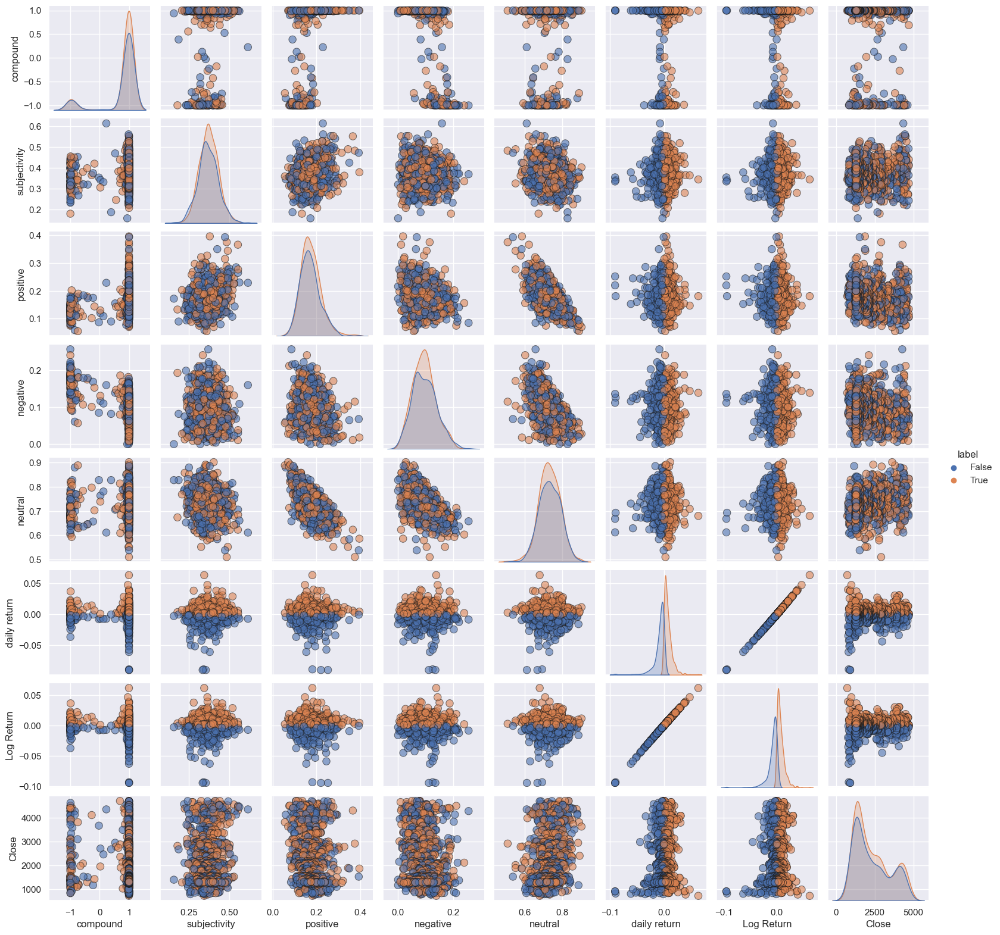

In [84]:
#to plot the pair plot for all the variable to check on any obvius interdependece of the variables

#S&P500
plt.figure(figsize=(4,4))
sns.set(font_scale=1)
sns.pairplot(df_1,vars=["compound","subjectivity","positive","negative","neutral","daily return","Log Return","Close"],hue="label",plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
             height = 2)




C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating ins

<Figure size 400x400 with 0 Axes>

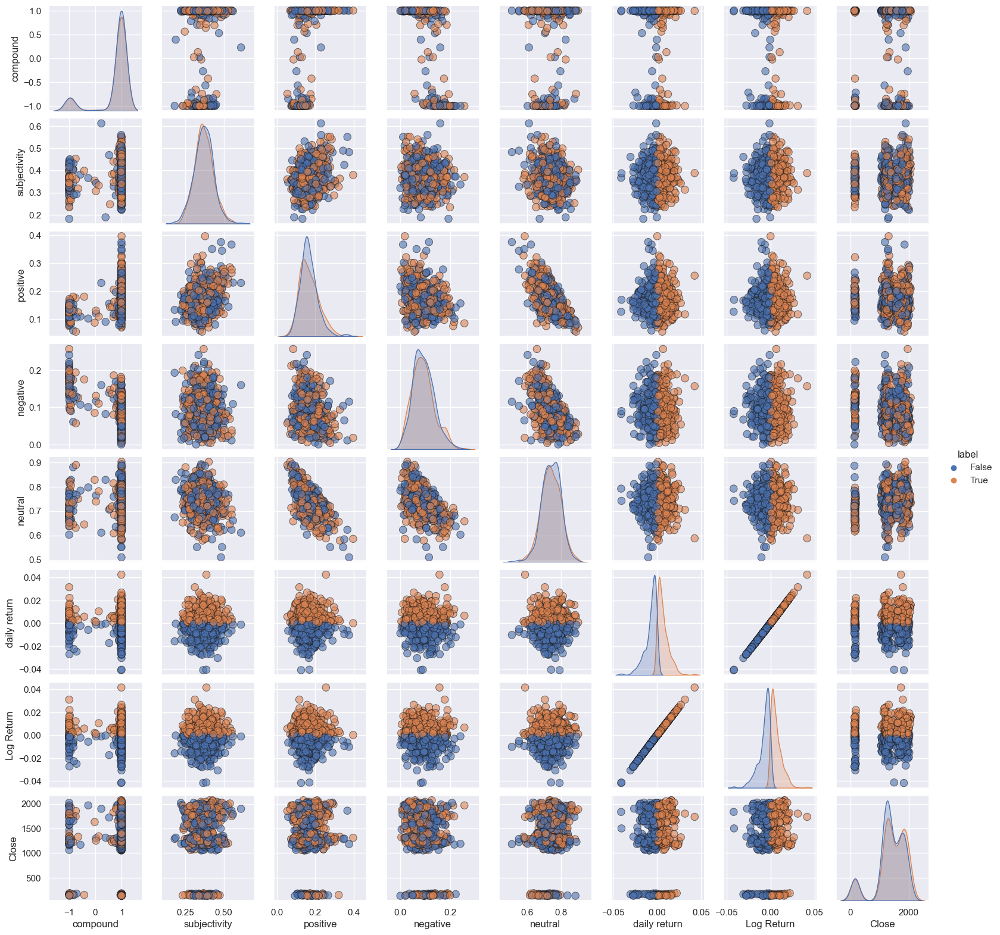

In [85]:

#gold
plt.figure(figsize=(4,4))
sns.set(font_scale=1)
sns.pairplot(df_2,vars=["compound","subjectivity","positive","negative","neutral","daily return","Log Return","Close"],hue="label",plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
             height = 2)



C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating ins

<Figure size 400x400 with 0 Axes>

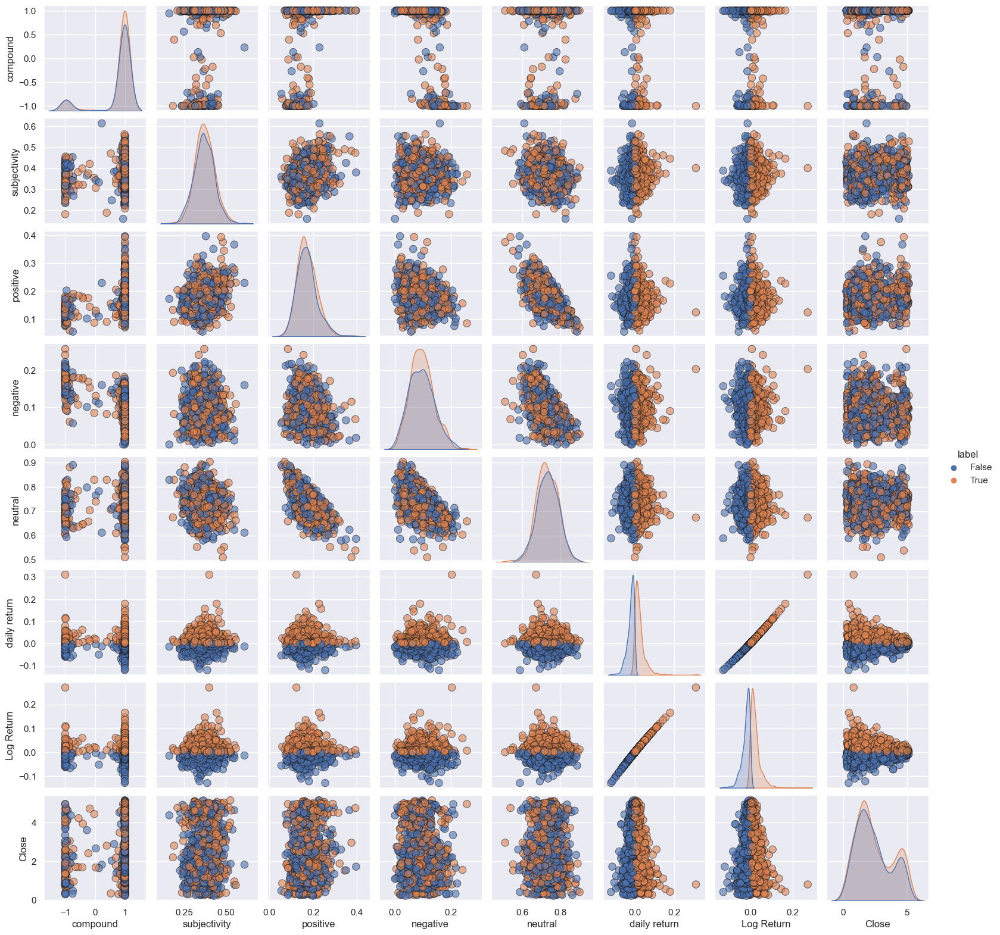

In [86]:
#10y treasury bond rate 
plt.figure(figsize=(4,4))
sns.set(font_scale=1)
sns.pairplot(df_3,vars=["compound","subjectivity","positive","negative","neutral","daily return","Log Return","Close"],hue="label",plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
             height = 2)

C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating ins

<Figure size 400x400 with 0 Axes>

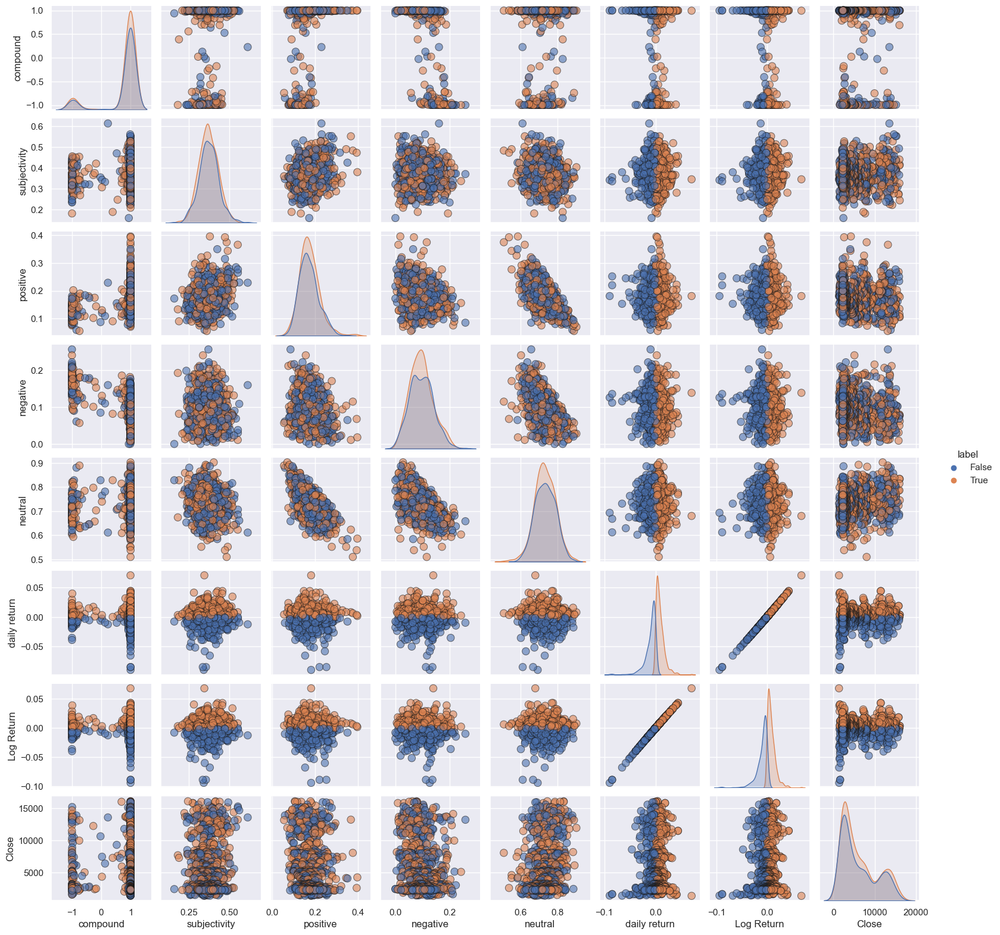

In [87]:
#nasdaq

plt.figure(figsize=(4,4))
sns.set(font_scale=1)
sns.pairplot(df_4,vars=["compound","subjectivity","positive","negative","neutral","daily return","Log Return","Close"],hue="label",plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
             height = 2)


C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating ins

<Figure size 400x400 with 0 Axes>

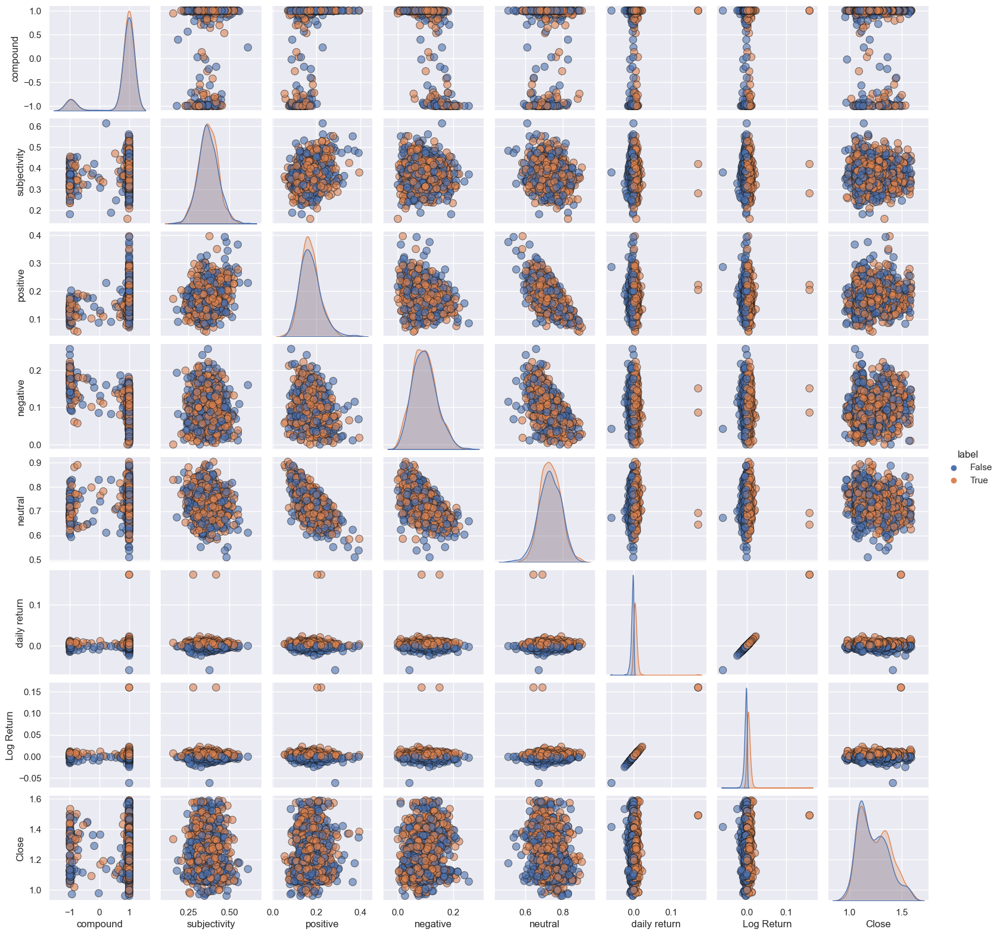

In [88]:
#EURUSD

plt.figure(figsize=(4,4))
sns.set(font_scale=1)
sns.pairplot(df_5,vars=["compound","subjectivity","positive","negative","neutral","daily return","Log Return","Close"],hue="label",plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
             height = 2)

### Create feature data for model testing
-use machine model to train the data and predict the data set. \
-we want to know how well the x_ features data set can used to predict the daily return of the S&P 500 index, gold index, 10 years bond rate, NASDAQ and EURUSD currency pair
-we decided to use Logistic Regression model , because we are not predicting the price \
instead we just want to know how accurate positive /negative sentiment of FED speeches to predict a positive / negative return of the instrument's price . 


In [42]:
#download libraries
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, precision_recall_fscore_support
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
import numpy as np

#S&P500

##create feature data set
X= df_1.drop(columns=["label"])

#create the target data set
y=df_1["label"]

#split the data into 80% train and 20% test;
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [44]:
#initiate and train the RL model

logistic_regression_model=LogisticRegression()
logistic_regression_model.fit(x_train,y_train)

LogisticRegression()

In [45]:
#predict the model x test set

y_prediction=logistic_regression_model.predict(x_test)

In [46]:
#evaluate the  model 
precision, recall, fscore, support = precision_recall_fscore_support(y_test, y_prediction, zero_division=1)


# Print metrics
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F-score: {fscore}')

Precision: [0.87804878 0.93277311]
Recall: [0.9        0.91735537]
F-score: [0.88888889 0.925     ]


In [47]:
#  classification report with zero_division=1 (default)
report = classification_report(y_test, y_prediction, zero_division=1)
print(report)

              precision    recall  f1-score   support

       False       0.88      0.90      0.89        80
        True       0.93      0.92      0.93       121

    accuracy                           0.91       201
   macro avg       0.91      0.91      0.91       201
weighted avg       0.91      0.91      0.91       201



### Repeat the model training and prediction with Gold index 

In [50]:

##create feature data set
X= df_2.drop(columns=["label"])

#create the target data set
y=df_2["label"]

#split the data into 80% train and 20% test;
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [52]:
#initiate and train the RL model

logistic_regression_model=LogisticRegression()
logistic_regression_model.fit(x_train,y_train)

#predict the model x test set

y_prediction=logistic_regression_model.predict(x_test)

In [53]:
#evaluate the  model 
precision, recall, fscore, support = precision_recall_fscore_support(y_test, y_prediction, zero_division=1)


# Print metrics
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F-score: {fscore}')

Precision: [0.4137931  0.56756757]
Recall: [0.2    0.7875]
F-score: [0.26966292 0.65968586]


In [54]:
#  classification report with zero_division=1 (default)
report = classification_report(y_test, y_prediction, zero_division=1)
print(report)

              precision    recall  f1-score   support

       False       0.41      0.20      0.27        60
        True       0.57      0.79      0.66        80

    accuracy                           0.54       140
   macro avg       0.49      0.49      0.46       140
weighted avg       0.50      0.54      0.49       140



### Repeat the model testing with 10 years Tresuary Bond Rate 

In [56]:
##create feature data set
X= df_3.drop(columns=["label"])

#create the target data set
y=df_3["label"]

#split the data into 80% train and 20% test;
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [57]:
#initiate and train the RL model

logistic_regression_model=LogisticRegression()
logistic_regression_model.fit(x_train,y_train)

LogisticRegression()

In [58]:
#predict the model x test set

y_prediction=logistic_regression_model.predict(x_test)

In [59]:
#evaluate the  model 
precision, recall, fscore, support = precision_recall_fscore_support(y_test, y_prediction, zero_division=1)


# Print metrics
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F-score: {fscore}')

Precision: [0.31034483 0.5872093 ]
Recall: [0.1125     0.83471074]
F-score: [0.16513761 0.6894198 ]


In [60]:
#  classification report with zero_division=1 (default)
report = classification_report(y_test, y_prediction, zero_division=1)
print(report)

              precision    recall  f1-score   support

       False       0.31      0.11      0.17        80
        True       0.59      0.83      0.69       121

    accuracy                           0.55       201
   macro avg       0.45      0.47      0.43       201
weighted avg       0.48      0.55      0.48       201



### Repeat the model testing with NASDAQ

In [89]:
##create feature data set
X= df_3.drop(columns=["label"])

#create the target data set
y=df_3["label"]

#split the data into 80% train and 20% test;
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [90]:
#initiate and train the RL model

logistic_regression_model=LogisticRegression()
logistic_regression_model.fit(x_train,y_train)

LogisticRegression()

In [91]:
#predict the model x test set

y_prediction=logistic_regression_model.predict(x_test)


In [92]:
#evaluate the  model 
precision, recall, fscore, support = precision_recall_fscore_support(y_test, y_prediction, zero_division=1)


# Print metrics
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F-score: {fscore}')

Precision: [0.9382716 0.825    ]
Recall: [0.78350515 0.95192308]
F-score: [0.85393258 0.88392857]


In [93]:
#  classification report with zero_division=1 (default)
report = classification_report(y_test, y_prediction, zero_division=1)
print(report)

              precision    recall  f1-score   support

       False       0.94      0.78      0.85        97
        True       0.82      0.95      0.88       104

    accuracy                           0.87       201
   macro avg       0.88      0.87      0.87       201
weighted avg       0.88      0.87      0.87       201



### Repeat the model testing with currency pair EURUSD

In [96]:
##create feature data set
X= df_3.drop(columns=["label"])

#create the target data set
y=df_3["label"]

#split the data into 80% train and 20% test;
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [97]:
#initiate and train the RL model

logistic_regression_model=LogisticRegression()
logistic_regression_model.fit(x_train,y_train)

LogisticRegression()

In [98]:
#predict the model x test set

y_prediction=logistic_regression_model.predict(x_test)

In [99]:
#evaluate the  model 
precision, recall, fscore, support = precision_recall_fscore_support(y_test, y_prediction, zero_division=1)


# Print metrics
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F-score: {fscore}')


Precision: [0.9382716 0.825    ]
Recall: [0.78350515 0.95192308]
F-score: [0.85393258 0.88392857]


In [100]:
#  classification report with zero_division=1 (default)
report = classification_report(y_test, y_prediction, zero_division=1)
print(report)

              precision    recall  f1-score   support

       False       0.94      0.78      0.85        97
        True       0.82      0.95      0.88       104

    accuracy                           0.87       201
   macro avg       0.88      0.87      0.87       201
weighted avg       0.88      0.87      0.87       201

